# DS7331 Project: Lab 2 Classification

- Hayoung Cheon
- Steven Cox
- Erika Dupond
- Miguel Zavala

Build upon predictive analysis adding K-Means clustering analysis.

In [7]:
import os
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
from IPython.display import display

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, MaxAbsScaler

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

In [8]:
data_dir = "Data"
csv_filename = "PhiUSIIL_Phishing_URL_Dataset.csv"
csv_path = os.path.join(data_dir, csv_filename)
url = "https://archive.ics.uci.edu/static/public/967/phiusiil+phishing+url+dataset.zip"

os.makedirs(data_dir, exist_ok=True)
if os.path.exists(csv_path):
    print(f"Loading data from local file: {csv_path}")
    df = pd.read_csv(csv_path, encoding="utf-8")
else:
    print(f"Local file not found. Downloading and reading from: {url}")
    df = pd.read_csv(url, encoding="utf-8")
    df.to_csv(csv_path, index=False, encoding="utf-8")
    print(f"Data saved locally to: {csv_path}")

df = df.drop("FILENAME", axis=1)
print(f"Dataset shape: {df.shape}")
print(f"Label distribution: {df['label'].value_counts(normalize=True).round(3)}")
df.head()


Loading data from local file: Data/PhiUSIIL_Phishing_URL_Dataset.csv
Dataset shape: (235795, 55)
Label distribution: label
1    0.572
0    0.428
Name: proportion, dtype: float64


,URL,URLLength,Domain,DomainLength,IsDomainIP,TLD,URLSimilarityIndex,CharContinuationRate,TLDLegitimateProb,URLCharProb,...,Pay,Crypto,HasCopyrightInfo,NoOfImage,NoOfCSS,NoOfJS,NoOfSelfRef,NoOfEmptyRef,NoOfExternalRef,label
0,https://www.southbankmosaics.com,31,www.southbankmosaics.com,24,0,com,100.0,1.000000,0.522907,0.061933,...,0,0,1,34,20,28,119,0,124,1
1,https://www.uni-mainz.de,23,www.uni-mainz.de,16,0,de,100.0,0.666667,0.032650,0.050207,...,0,0,1,50,9,8,39,0,217,1
2,https://www.voicefmradio.co.uk,29,www.voicefmradio.co.uk,22,0,uk,100.0,0.866667,0.028555,0.064129,...,0,0,1,10,2,7,42,2,5,1
3,https://www.sfnmjournal.com,26,www.sfnmjournal.com,19,0,com,100.0,1.000000,0.522907,0.057606,...,1,1,1,3,27,15,22,1,31,1
4,https://www.rewildingargentina.org,33,www.rewildingargentina.org,26,0,org,100.0,1.000000,0.079963,0.059441,...,1,0,1,244,15,34,72,1,85,1


In [9]:
y_true = df['label']
X_cluster = df.drop('label', axis=1)

numerical_features = X_cluster.select_dtypes(include=[np.number]).columns.tolist()
categorical_features = X_cluster.select_dtypes(include=['object']).columns.tolist()

print(f"Dataset shape: {X_cluster.shape}")
print(f"Numerical features: {len(numerical_features)}")
print(f"Categorical features: {len(categorical_features)}")

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), categorical_features)
    ],
    remainder='passthrough'
)

X_processed_array = preprocessor.fit_transform(X_cluster)

encoded_cat_names = [f"{col}_ordinal" for col in categorical_features]
final_columns = encoded_cat_names + numerical_features

X_processed = pd.DataFrame(X_processed_array, columns=final_columns)

print(f"Final feature set: {X_processed.shape}")
print(f"Using Full dataset of {len(X_processed):,} rows")

Dataset shape: (235795, 54)
Numerical features: 50
Categorical features: 4
Final feature set: (235795, 54)
Using Full dataset of 235,795 rows


## PCA Component Analysis

Determine optimal number of PCA components before scaling comparison. This will try to capture a good variance with compression of features

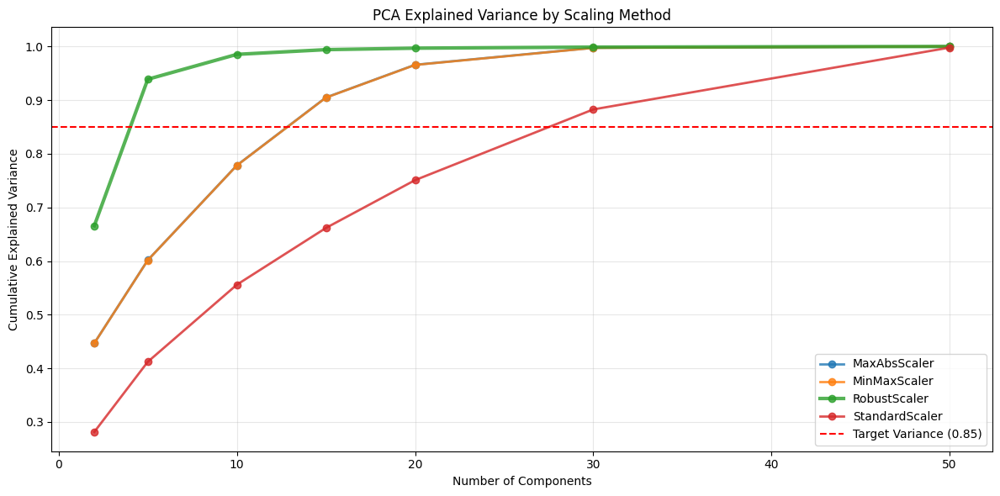

,Scaler,Best Scaler,Components Needed,Variance at Target,2 Components,5 Components,10 Components,15 Components,20 Components,30 Components,50 Components
2,RobustScaler,✓,5.000,0.939,0.666,0.939,0.985,0.994,0.997,0.999,1.000
1,MinMaxScaler,,15.000,0.905,0.447,0.601,0.778,0.905,0.966,0.997,1.000
3,MaxAbsScaler,,15.000,0.905,0.447,0.602,0.778,0.905,0.966,0.997,1.000
0,StandardScaler,,30.000,0.883,0.281,0.412,0.556,0.662,0.751,0.883,0.998


In [10]:
target_variance = 0.85
component_options = [2, 5, 10, 15, 20, 30, 50]

scalers = {
    'StandardScaler': StandardScaler(),
    'MinMaxScaler': MinMaxScaler(),
    'RobustScaler': RobustScaler(),
    'MaxAbsScaler': MaxAbsScaler(),
}

results = {}
all_results = []
best_scaler = None
min_components = float('inf')

for scaler_name, scaler in scalers.items():
    if scaler:
        X_scaled = scaler.fit_transform(X_processed)
    else:
        X_scaled = X_processed.copy().to_numpy()
    
    scaler_results = []
    for n_components in component_options:
        if n_components <= X_scaled.shape[1]:
            pca = PCA(n_components=n_components, random_state=42)
            pca.fit(X_scaled)
            explained_var = pca.explained_variance_ratio_.sum()
            
            if scaler_name not in results:
                results[scaler_name] = {}
            results[scaler_name][n_components] = explained_var
            
            scaler_results.append({
                'Components': n_components,
                'Explained Variance': explained_var
            })
            
            all_results.append({
                'Scaler': scaler_name,
                'Components': n_components,
                'Explained Variance': explained_var
            })
    

    df_scaler = pd.DataFrame(scaler_results)
    optimal_components = next((n for n in sorted(component_options) 
                             if n <= X_scaled.shape[1] and 
                             results[scaler_name][n] >= target_variance), 
                            max(component_options))
    
    if optimal_components < min_components:
        min_components = optimal_components
        best_scaler = scaler_name

summary_data = []
df_all = pd.DataFrame(all_results)
df_pivot = df_all.pivot(index='Components', columns='Scaler', values='Explained Variance')

for scaler_name in results:
    optimal = next((n for n in sorted(component_options) 
                   if results[scaler_name][n] >= target_variance), 
                  max(component_options))
    
    optimal_variance = results[scaler_name][optimal]
    variance_by_components = {comp: results[scaler_name].get(comp, np.nan) 
                             for comp in component_options}
    is_best = (scaler_name == best_scaler)
    
    row_data = {
        'Scaler': scaler_name,
        'Best Scaler': '✓' if is_best else '',
        'Components Needed': optimal,
        'Variance at Target': optimal_variance
    }

    for comp in component_options:
        row_data[f'{comp} Components'] = variance_by_components.get(comp, np.nan)
    
    summary_data.append(row_data)

df_summary = pd.DataFrame(summary_data)
df_summary = df_summary.sort_values('Components Needed')
first_columns = ['Scaler', 'Best Scaler', 'Components Needed', 'Variance at Target'] 
component_columns = [f'{comp} Components' for comp in component_options]
df_summary = df_summary[first_columns + component_columns]

plt.figure(figsize=(12, 6))
for scaler in df_pivot.columns:
    linestyle = '-'
    linewidth = 2
    marker = 'o'
    
    if scaler == best_scaler:
        linewidth = 3
        linestyle = '-'
    
    plt.plot(df_pivot.index, df_pivot[scaler], 
             label=scaler, 
             marker=marker,
             linestyle=linestyle,
             linewidth=linewidth,
             alpha=0.8)

plt.axhline(y=target_variance, color='r', linestyle='--', label=f'Target Variance ({target_variance:.2f})')

plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance by Scaling Method')
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

best_scaler_obj = scalers[best_scaler]
if best_scaler_obj:
    X_best_scaled = best_scaler_obj.fit_transform(X_processed)
else:
    X_best_scaled = X_processed.copy().to_numpy()

pca_3d = PCA(n_components=3, random_state=42)
X_pca_3d = pca_3d.fit_transform(X_best_scaled)

fig3d = px.scatter_3d(
    x=X_pca_3d[:, 0], 
    y=X_pca_3d[:, 1], 
    z=X_pca_3d[:, 2],
    color=y_true,
    labels=dict(x='PC1', y='PC2', z='PC3', color='Label'),
    title=f'PCA 3D Projection using {best_scaler} (interactive)',
    opacity=0.6
)

fig3d.update_layout(scene=dict(xaxis_title='PC1', yaxis_title='PC2', zaxis_title='PC3'))

fig3d.show()
display(df_summary.style
        .format({col: '{:.3f}' for col in df_summary.columns if 'Components' in col or 'Variance' in col})
        .highlight_max(subset=['Best Scaler'], color='lightgreen')
        .highlight_min(subset=['Components Needed'], color='lightgreen')
        .set_caption(f"PCA Scaling Strategy Comparison (Target Variance: {target_variance:.2f})"))

## Optimal Number of Clusters

Determine optimal k using elbow method with best scaler and PCA.


Best combination: RobustScaler with 5 components
  k=2: inertia=171319581.48
  k=3: inertia=138664517.83, drop=19.06%
  k=4: inertia=117669537.99, drop=15.14%
 **** Drop reduced by 35.7% - at k=3
  k=5: inertia=97528290.01, drop=17.12%
  k=6: inertia=79976977.51, drop=18.00%
  k=7: inertia=59863842.35, drop=25.15%
  k=8: inertia=51133066.52, drop=14.58%
 **** Drop reduced by 56.6% - at k=7
  k=9: inertia=43851043.43, drop=14.24%
  k=10: inertia=37499569.99, drop=14.48%
  k=11: inertia=32395487.61, drop=13.61%
  k=12: inertia=28612817.13, drop=11.68%
  k=13: inertia=25190752.45, drop=11.96%
  k=14: inertia=22774451.84, drop=9.59%


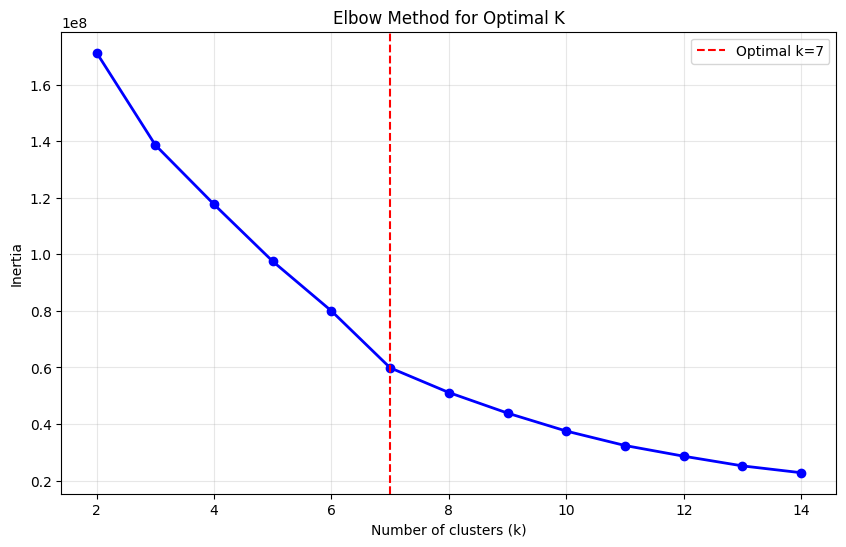


Optimal k = 7


In [11]:

print(f"\nBest combination: {best_scaler} with {min_components} components")

best_scaler_method = scalers[best_scaler]
X_best_scaled = best_scaler_method.fit_transform(X_processed)

optimal_pca = PCA(n_components=min_components, random_state=42)
X_pca_optimal = optimal_pca.fit_transform(X_best_scaled)

max_k, min_k = 15, 2

inertias = []
optimal_k = None
previous_drop = None
drop_threshold = 30
k_range = range(min_k, max_k)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_pca_optimal)
    inertias.append(kmeans.inertia_)
    
    if len(inertias) > 1:
        current_drop = inertias[-2] - inertias[-1]
        drop_percentage = (current_drop / inertias[-2]) * 100
        print(f"  k={k}: inertia={kmeans.inertia_:.2f}, drop={drop_percentage:.2f}%")
        if previous_drop is not None:
            drop_reduction = ((previous_drop - current_drop) / previous_drop) * 100
            if drop_reduction > drop_threshold:
                optimal_k = k - 1
                print(f" **** Drop reduced by {drop_reduction:.1f}% - at k={optimal_k}")
        previous_drop = current_drop
    else:
        print(f"  k={k}: inertia={kmeans.inertia_:.2f}")

if optimal_k is None:
    optimal_k = list(k_range)[len(k_range)//2]


actual_k_values = list(k_range)[:len(inertias)]

plt.figure(figsize=(10, 6))
plt.plot(actual_k_values, inertias, 'bo-', linewidth=2)
if optimal_k is not None:
    plt.axvline(optimal_k, color='red', linestyle='--', label=f'Optimal k={optimal_k}')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print(f"\nOptimal k = {optimal_k}")


## K-Means Analysis

Apply final K-Means clustering with optimized parameters.

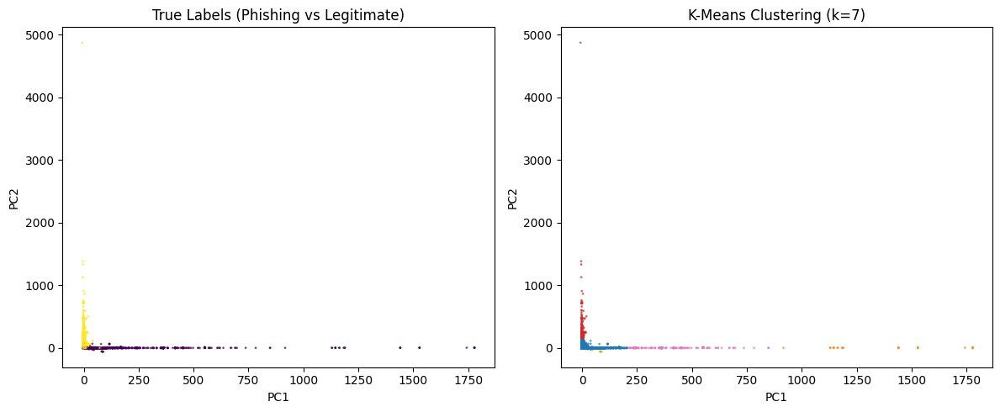

,Scaler,PCA Components,Explained Variance,Clusters,Inertia,Iterations
0,RobustScaler,5,0.93886,7,5.986384e+07,6


,Cluster,Samples,Phishing %
0,0,235210,57.2
1,1,22,0.0
2,2,355,100.0
3,3,1,100.0
4,4,199,0.0
5,5,7,0.0
6,6,1,100.0


In [12]:
kmeans_final = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
kmeans_labels = kmeans_final.fit_predict(X_pca_optimal)

pca_2d = PCA(n_components=2, random_state=42)
X_pca_2d = pca_2d.fit_transform(X_best_scaled)
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].scatter(X_pca_2d[:, 0], X_pca_2d[:, 1], c=y_true, cmap='viridis', alpha=0.6, s=1)
axes[0].set_title('True Labels (Phishing vs Legitimate)')
axes[0].set_xlabel('PC1')
axes[0].set_ylabel('PC2')

axes[1].scatter(X_pca_2d[:, 0], X_pca_2d[:, 1], c=kmeans_labels, cmap='tab10', alpha=0.6, s=1)
axes[1].set_title(f'K-Means Clustering (k={optimal_k})')
axes[1].set_xlabel('PC1')
axes[1].set_ylabel('PC2')

plt.tight_layout()
plt.show()

pca_df = pd.DataFrame({
    'PC1': X_pca_optimal[:, 0],
    'PC2': X_pca_optimal[:, 1],
    'PC3': X_pca_optimal[:, 2],
    'TrueLabel': y_true,
    'Cluster': kmeans_labels
})

fig = px.scatter_3d(
    pca_df,
    x='PC1', y='PC2', z='PC3',
    color=pca_df['Cluster'].astype(str),
    symbol=pca_df['TrueLabel'].astype(str),
    opacity=0.6,
    title='Interactive 3D Clusters (PC1–PC3)',
    labels={'Cluster': 'Cluster', 'TrueLabel': 'True Label'}
)
fig.update_traces(marker=dict(size=3))
fig.show()

summary_df = pd.DataFrame({
    "Scaler": [best_scaler],
    "PCA Components": [min_components],
    "Explained Variance": [optimal_pca.explained_variance_ratio_.sum()],
    "Clusters": [len(np.unique(kmeans_labels))],
    "Inertia": [kmeans_final.inertia_],
    "Iterations": [kmeans_final.n_iter_]
})

cluster_stats = []
for cluster_id in range(optimal_k):
    mask = kmeans_labels == cluster_id
    cluster_labels = y_true[mask]
    phishing_pct = (cluster_labels == 1).mean() * 100
    cluster_stats.append({
        "Cluster": cluster_id,
        "Samples": len(cluster_labels),
        "Phishing %": round(phishing_pct, 1)
    })

cluster_df = pd.DataFrame(cluster_stats)

display(summary_df)
display(cluster_df)